# Initial Conditions Optimization
## Plot History

In [1]:
%matplotlib inline
import matplotlib
matplotlib.font_manager._rebuild()
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.style as style
style.use('fivethirtyeight')
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import pandas as pd
import numpy as np
from datetime import datetime,timedelta
import io
import os
from IPython.display import display, HTML, Markdown
from datetime import date
from datetime import datetime

## Load PlayFair Display and Roboto Fonts from Google

In [2]:
from tempfile import NamedTemporaryFile
import urllib.request
import matplotlib.font_manager as fm

github_url = 'https://github.com/google/fonts/raw/master/ofl/playfairdisplay/static/PlayfairDisplay-Regular.ttf'
url = github_url  # You want the actual file, not some html

headers = {}
headers['User-Agent'] = "Mozilla/5.0 (X11; Linux i686) AppleWebKit/537.17 (KHTML, like Gecko) Chrome/24.0.1312.27 Safari/537.17"

request = urllib.request.Request(url,headers=headers)
response = urllib.request.urlopen(request)
f = NamedTemporaryFile(delete=False, suffix='.ttf')
f.write(response.read())
f.close()

heading_font = fm.FontProperties(fname=f.name, size=28)

github_url = 'https://github.com/google/fonts/raw/master/apache/roboto/static/Roboto-Regular.ttf'
url = github_url  # You want the actual file, not some html

request = urllib.request.Request(url,headers=headers)
response = urllib.request.urlopen(request)
f = NamedTemporaryFile(delete=False, suffix='.ttf')
f.write(response.read())
f.close()
subtitle_font = fm.FontProperties(fname=f.name, size=20)


## Load Humor Sans Font

In [3]:
# github_url = 'http://antiyawn.com/uploads/Humor-Sans-1.0.ttf'
# github_url = 'https://github.com/ipython/xkcd-font/blob/master/xkcd-script/font/xkcd-script.ttf'
github_url = 'https://github.com/ipython/xkcd-font/raw/master/xkcd/build/xkcd-Regular.otf'
# github_url = 'https://github.com/shreyankg/xkcd-desktop/blob/master/Humor-Sans.ttf'
url = github_url  # You want the actual file, not some html

request = urllib.request.Request(url,headers=headers)
response = urllib.request.urlopen(request)
f = NamedTemporaryFile(delete=False, suffix='.ttf')
f.write(response.read())
f.close()
comic_font = fm.FontProperties(fname=f.name, size=18)

# Main code

In [4]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines){
    return false;}

<IPython.core.display.Javascript object>

## Load Initial Parameters

In [5]:
dfparam = pd.read_csv("data/param.csv")
display(dfparam)


,country,start-date,prediction-range,s0,e0,a0,i0,r0,d0,START,WCASES,WREC,WDTH
0,Brazil,3/2/20,200,10000000.0,0.0001,0.0001,200,100,50,50,0.15,0.05,0.8
1,China,1/28/20,200,50000.0,0.0001,0.0001,200,100,50,50,0.15,0.05,0.8
2,Italy,2/28/20,200,2000000.0,0.0001,0.0001,200,100,50,50,0.15,0.05,0.8
3,US,2/20/20,200,20000000.0,0.0001,0.0001,200,100,50,50,0.15,0.05,0.8
4,India,3/10/20,200,10000000.0,0.0001,0.0001,200,100,50,50,0.15,0.05,0.8


## Select data set

In [6]:
opt=8

#select history file version, model and states
model="Yabox"
countries=dfparam.country  

if opt==6:
    version="009" 
    
if opt==7:
    version="010" 

if opt==8:
    version="011" 

In [7]:
strFile="results/IC_optimizedCountries"+version+".csv"
if os.path.isfile(strFile):
    os.remove(strFile)

## Plot Parameters Function

In [8]:
def make_patch_spines_invisible(ax):
    ax.set_frame_on(True)
    ax.patch.set_visible(False)
    for sp in ax.spines.values():
        sp.set_visible(False)

def plotParams(country,model,histMin,paramList,paramListNames,version):
    
    #prepare plotting
    color_bg = '#FEF1E5'
    lighter_highlight = '#FAE6E1'
    darker_highlight = '#FBEADC' 

    histShow=histMin.nsmallest(20, ['gtot']).sort_values('gtot',ignore_index=True,ascending=False)

    with plt.xkcd():

        fig, host = plt.subplots(figsize=(15, 10),facecolor=color_bg)
        fig.subplots_adjust(right=0.75)
        host.patch.set_facecolor(darker_highlight)

        plt.rc('font', size=16)        

        #fonts for the thicks
        for label in (host.get_xticklabels() + host.get_yticklabels()):
            label.set_fontproperties(comic_font)
            label.set_fontsize(16) # Size here overrides font_prop

        par1 = host.twinx()
        par2 = host.twinx()
        par3 = host.twinx()

        # Offset the right spine of par2.  The ticks and label have already been
        # placed on the right by twinx above.
        par2.spines["right"].set_position(("axes", 1.1))
        par3.spines["right"].set_position(("axes", 1.2))


        # Having been created by twinx, par2 has its frame off, so the line of its
        # detached spine is invisible.  First, activate the frame but make the patch
        # and spines invisible.
        make_patch_spines_invisible(par2)
        make_patch_spines_invisible(par1)
        make_patch_spines_invisible(par3)

        # Second, show the right spine.
        par2.spines["right"].set_visible(True)
        par2.spines["right"].set_color("white")
        par2.spines["right"].set_linewidth(2)  
        par2.spines["right"].set_linestyle((0,(3,3)))   
        par2.spines["right"].set_capstyle("butt")

        par3.spines["right"].set_visible(True)
        par3.spines["right"].set_color("white")
        par3.spines["right"].set_linewidth(2)  
        par3.spines["right"].set_linestyle((0,(3,3)))   
        par3.spines["right"].set_capstyle("butt")

    # # Hide the left, right and top spines
        host.spines['top'].set_visible(False)
        host.spines['right'].set_visible(False)
        host.spines['left'].set_visible(False)

        p1 = histShow.reset_index().plot(x='index',y=paramList[0],ax=host, style="o-")
        p2 = histShow.reset_index().plot(x='index',y=paramList[1],ax=par1, style="r-")
        p3=  histShow.reset_index().plot(x='index',y=paramList[2],ax=par2, style="g-")
        p4=  histShow.reset_index().plot(x='index',y=paramList[3],ax=par3, style="b-")

        host.set_ylim(0, histShow[paramList[0]].max()*1.5)
        par1.set_ylim(0, histShow[paramList[1]].max()*1.5)
        par2.set_ylim(0, histShow[paramList[2]].max()*1.5)
        par3.set_ylim(0, histShow[paramList[3]].max()*1.5)

        host.set_xlabel("Direction of Convergence")
        host.set_ylabel(paramListNames[0])
        par1.set_ylabel(paramListNames[1])
        par2.set_ylabel(paramListNames[2])
        par3.set_ylabel(paramListNames[3])

        host.legend().remove()    
        par1.legend().remove()   
        par2.legend().remove()  
        par3.legend().remove()  

        line_labels = [paramList[0], paramList[1], paramList[2], paramList[3]]
        plt.subplots_adjust(top=1.2)                       
        fig.legend(labels=line_labels,   # The labels for each line
                   loc=(0.6, 0.68),   # Position of legend
                   borderaxespad=0.1,    # Small spacing around legend box
                   title="Initial Conditions",  # Title for the legend
                   frameon=False
                   )
        host.grid(True, linestyle='--', linewidth=2, color='white',alpha=0.1)
        
        # Adding a title and a subtitle
        plt.text(x = 0.02, y = 1.11, s = "Parameters History - "+country,
                    fontsize = 34, weight = 'bold', alpha = .75,transform=host.transAxes, 
                    fontproperties=heading_font)
        plt.text(x = 0.02, y = 1.06,
                    s = "optimization by "+model,
                    fontsize = 26, alpha = .85,transform=host.transAxes, 
                    fontproperties=subtitle_font)
        

        fig.tight_layout(pad=0.5)
        strFile ='./results/parameters'+country+versionStr+'.png'
        fig.savefig(strFile, facecolor=fig.get_facecolor(), edgecolor=fig.get_edgecolor())

        plt.show()
        plt.close(fig)

## Plot History Function

In [9]:
def plotHistory(country,model,histOptAll,versionStr):

    #prepare plotting
    color_bg = '#FEF1E5'
    # lighter_highlight = '#FAE6E1'
    darker_highlight = '#FBEADC'
    plt.rc('font', size=14)
    
    with plt.xkcd():
        fig, ax = plt.subplots(figsize=(15, 10),facecolor=color_bg)
        ax.patch.set_facecolor(darker_highlight)
        
        #fonts for the thicks
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontproperties(comic_font)
            label.set_fontsize(16) # Size here overrides font_prop
        
        #labels for x and y axis
        plt.xlabel("Iterations", fontproperties=comic_font, alpha = .75)
        plt.ylabel("Error in Objective Function", fontproperties=comic_font, alpha = .75)
        
        # Hide the left, right and top spines
        ax.spines['left'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)

        #PLOTTING itself
        x=histOptAll.index
        y=histOptAll.gtot
        ax.plot(x,y, label="gtot")
        display(Markdown("## 5 Lowest Results"))
        histMin=histOptAll.nsmallest(5, ['gtot']).sort_values('gtot').iloc[:,0:11]
        display(histMin)

        ax.scatter(histMin.index, histMin.gtot,label="5 lowest",c='red',marker='*',s=400)
        histOptAll.rolling(100).mean()['gtot'].plot(label="100th average",c='gray')

        # Adding a title and a subtitle
        plt.text(x = 0.02, y = 1.11, s = "Initial Conditions Optimization - "+country,
                    fontsize = 34, weight = 'bold', alpha = .75,transform=ax.transAxes, 
                    fontproperties=heading_font)
        plt.text(x = 0.02, y = 1.06,
                    s = "optimization by "+model,
                    fontsize = 26, alpha = .85,transform=ax.transAxes, 
                    fontproperties=subtitle_font)
        
        leg=ax.legend(frameon=False,prop=comic_font,fontsize=16)
        for lh in leg.legendHandles: 
            lh.set_alpha(0.75)
        ax.grid(True, linestyle='--', linewidth='2', color='white',alpha=0.1)

        fig.tight_layout()
        strFile ='./results/convergence_'+country+versionStr+'.png'
        fig.savefig(strFile, facecolor=fig.get_facecolor(), edgecolor=fig.get_edgecolor())
        plt.show()
        
        fig, ax = plt.subplots(figsize=(15, 10),facecolor=color_bg)
        ax.patch.set_facecolor(darker_highlight)
        
        # Hide the left, right and top spines
        ax.spines['left'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
        
        #fonts for the thicks
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontproperties(comic_font)
            label.set_fontsize(16) # Size here overrides font_prop
        
        histMin=histOptAll.iloc[:,0:9]
        histMin.sort_index(inplace=True)
        
        histMin['error']=histMin.gtot/histMin.gtot.max()*100
        x=histMin.index[histMin.error<(histMin.error.mean()-0.1*histMin.error.std())]
        y=histMin.error[histMin.error<(histMin.error.mean()-0.1*histMin.error.std())]
                
        ax.plot(x, y, label="mean-$10\% \cdot \sigma$",c='green')
        histMin2=histMin.nsmallest(10, ['gtot']).sort_values('gtot')
        ax.scatter(histMin2.index, histMin2.gtot/histMin.gtot.max()*100,
                   label="10 lowest",c='red',marker='*',s=400)
        
        #labels for x and y axis
        plt.xlabel("Iterations", fontproperties=comic_font, alpha = .75)
        plt.ylabel("Relative Error $g_{tot}/max(g_{tot})$ [%]", 
                   fontproperties=comic_font, alpha = .75)

        # Adding a title and a subtitle
        plt.text(x = 0.02, y = 1.11, s = "Selected Minimum Values - "+country,
                    fontsize = 34, weight = 'bold', alpha = .75,transform=ax.transAxes, 
                    fontproperties=heading_font)
        plt.text(x = 0.02, y = 1.06,
                    s = "optimization by "+model,
                    fontsize = 26, alpha = .85,transform=ax.transAxes, 
                    fontproperties=subtitle_font)
        
        leg=ax.legend(frameon=False,prop=comic_font,fontsize=16)
        for lh in leg.legendHandles: 
            lh.set_alpha(0.75)
        ax.grid(True, linestyle='--', linewidth='2', color='white',alpha=0.1)

        fig.tight_layout()
        strFile ='./results/minimumPoints_'+country+versionStr+'.png'
        fig.savefig(strFile, facecolor=fig.get_facecolor(), edgecolor=fig.get_edgecolor())
        plt.show()
        plt.close()
        
    return histMin
        

# Loop Data All Countries

In [10]:
def calculateWeights(df):
    wt=df.wcases+df.wrec+df.wdth
    df['wcases']=df.wcases/wt
    df['wrec']=df.wrec/wt
    df['wdth']=df.wdth/wt
    df['wcases'] = df['wcases'].apply(lambda x: round(x,4))
    df['wrec'] = df['wrec'].apply(lambda x: round(x,4))
    df['wdth'] = df['wdth'].apply(lambda x: round(x,4))
    return df

# Results for Brazil

,gtot,startdate,startNcases,s0,i0,d0,r0,wcases,wrec,wdth
36,4.294992e+10,2020-03-01,246,5351475,94,195,232,0.1923,0.3714,0.4363


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,r0,wcases,wrec,wdth
36,4.294992e+10,2020-03-01,246,5351475,94,195,232,0.1923,0.3714,0.4363
60,5.334146e+10,2020-02-29,105,9045410,44,200,120,0.2150,0.1535,0.6314
87,8.282951e+10,2020-03-02,150,42648305,93,168,229,0.3205,0.2839,0.3957
31,8.549760e+10,2020-03-01,9,116347578,158,150,234,0.3739,0.0756,0.5505
7,1.112079e+11,2020-03-03,135,37776869,71,123,74,0.3976,0.1459,0.4565


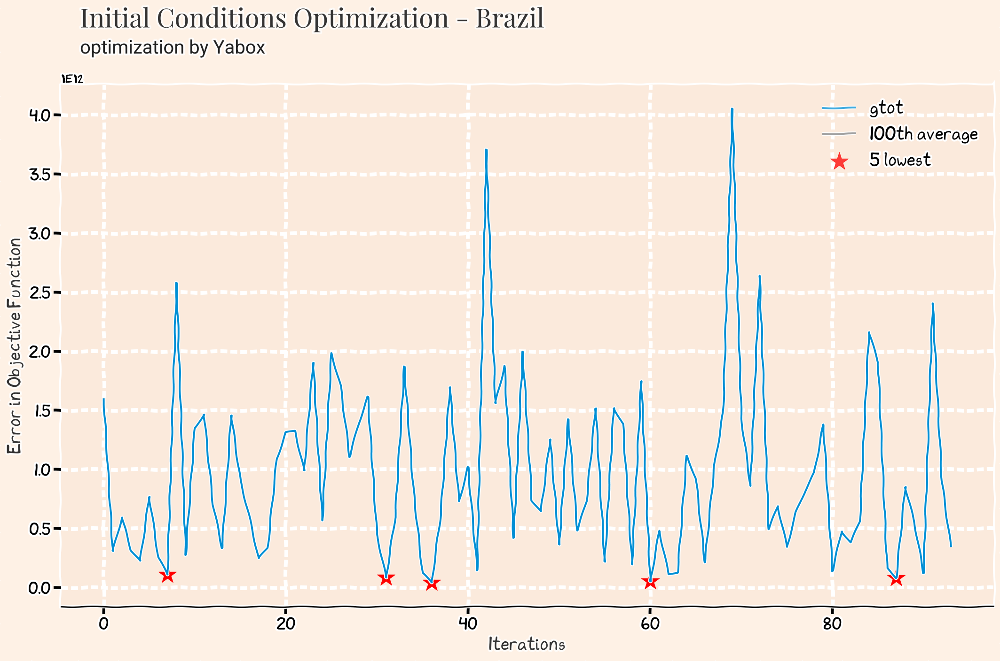

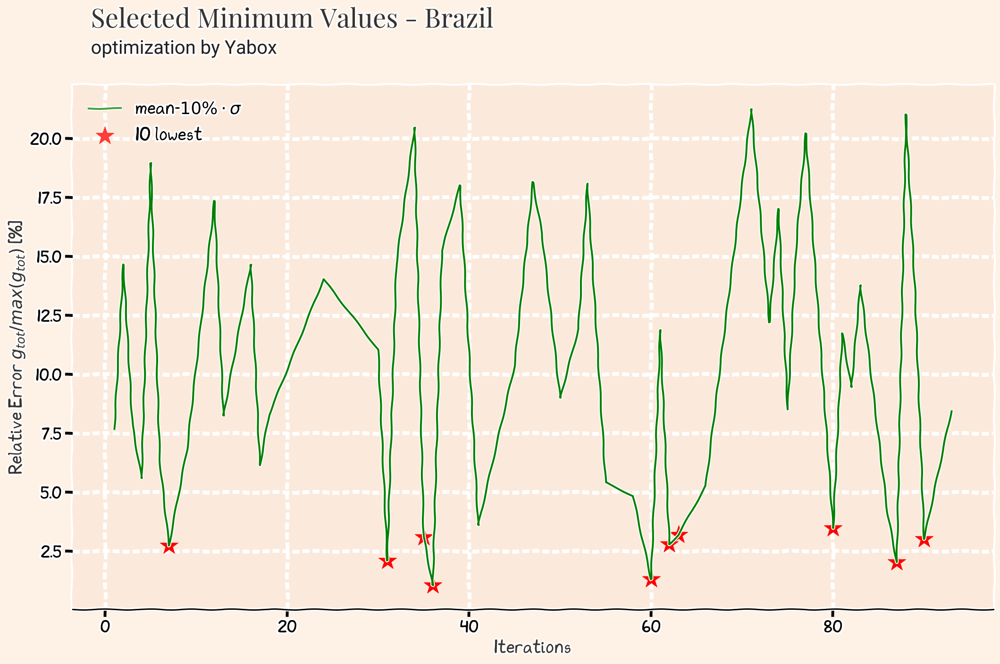

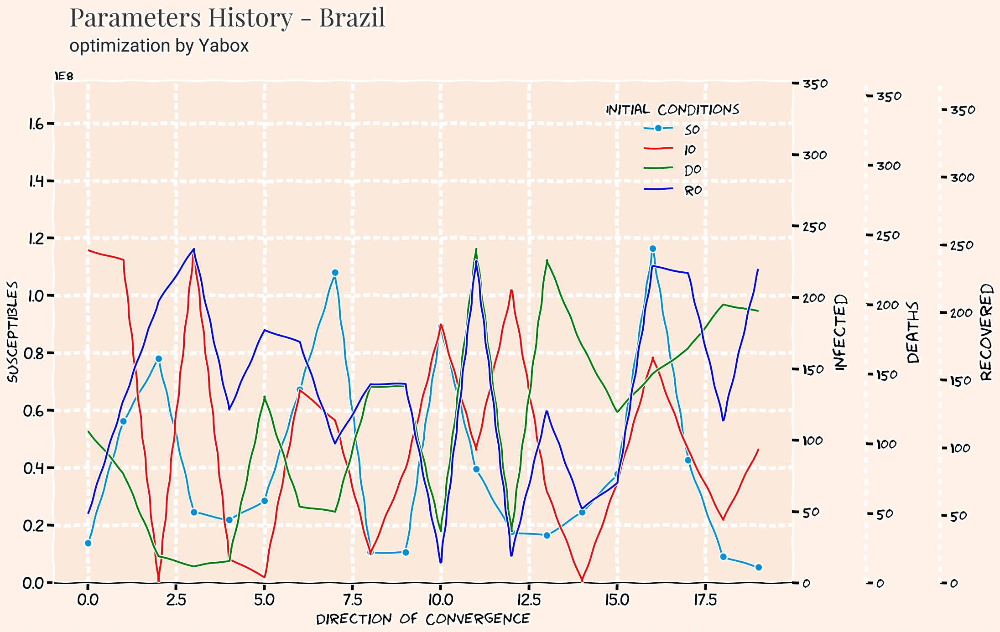

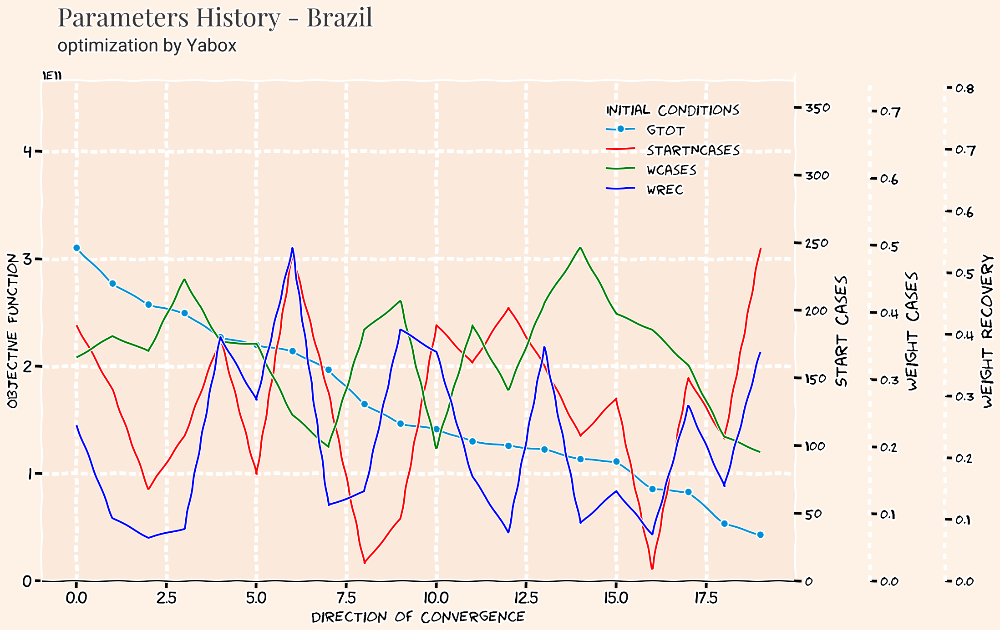

# Results for China

,gtot,startdate,startNcases,s0,i0,d0,r0,wcases,wrec,wdth
72,4.014411e+07,2020-01-27,75,327516,101,6,117,0.1318,0.4468,0.4214


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,r0,wcases,wrec,wdth
72,4.014411e+07,2020-01-27,75,327516,101,6,117,0.1318,0.4468,0.4214
105,1.875863e+08,2020-01-28,84,28876956,197,37,211,0.2613,0.2188,0.5199
39,2.683804e+08,2020-01-28,248,73257705,79,7,244,0.4841,0.1279,0.3881
22,3.267221e+08,2020-01-28,179,22207783,145,13,179,0.3519,0.4131,0.2350
15,4.264045e+08,2020-01-26,105,28876956,58,37,191,0.1638,0.0828,0.7534


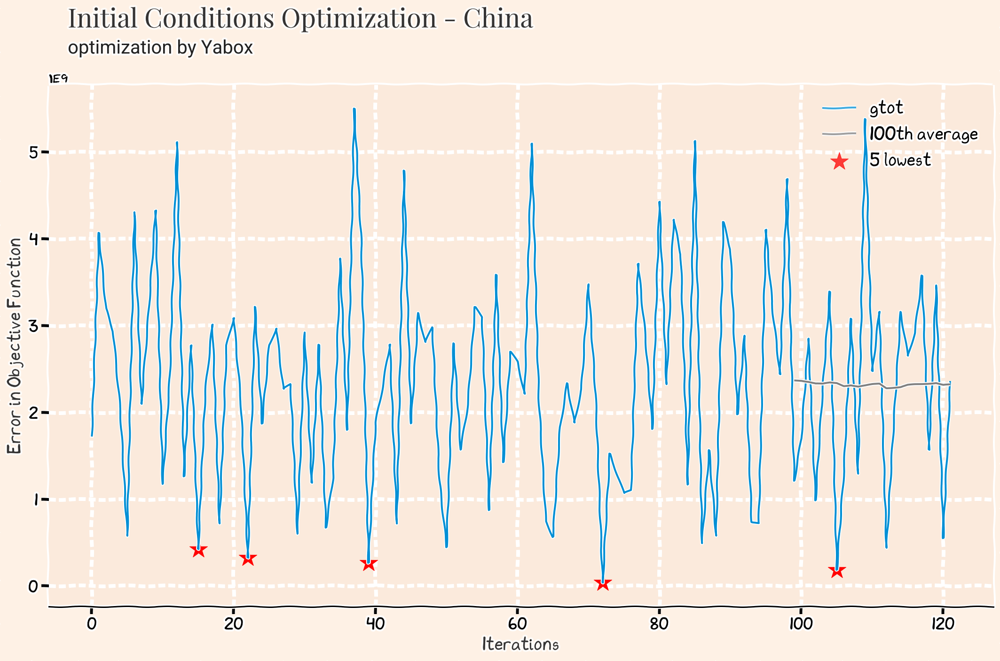

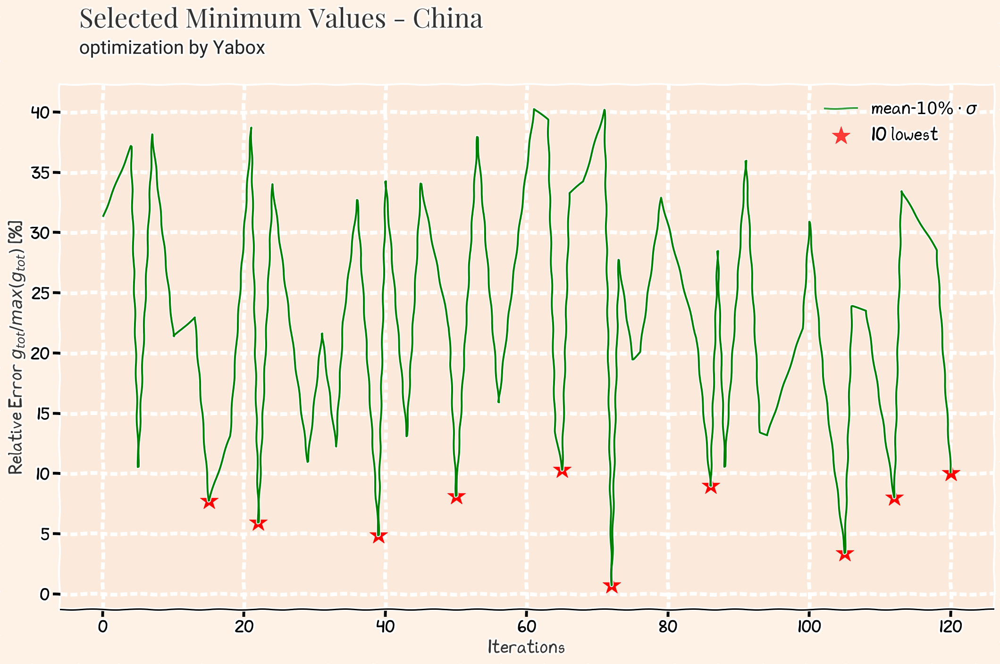

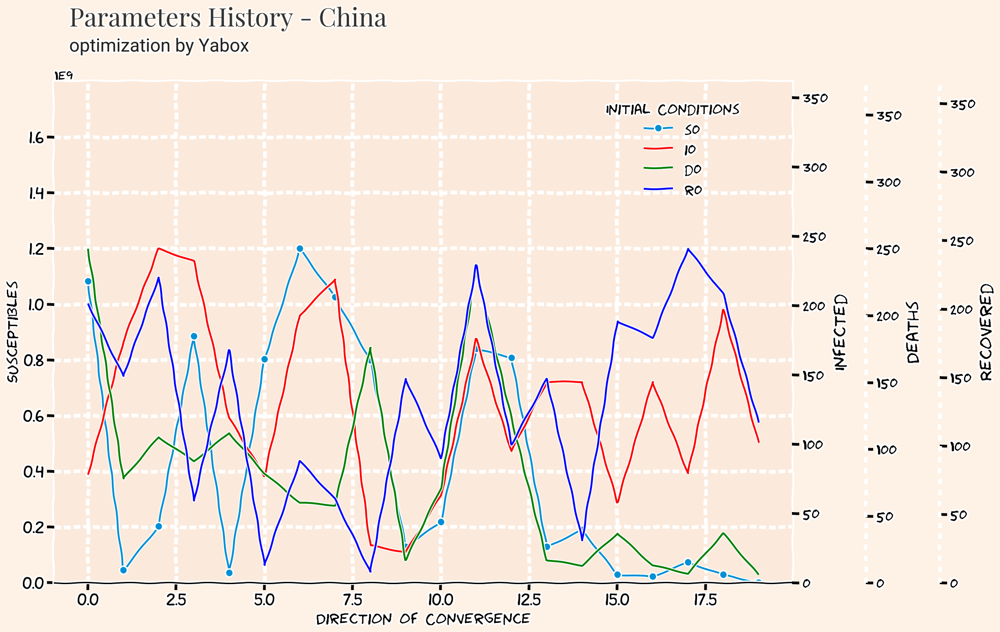

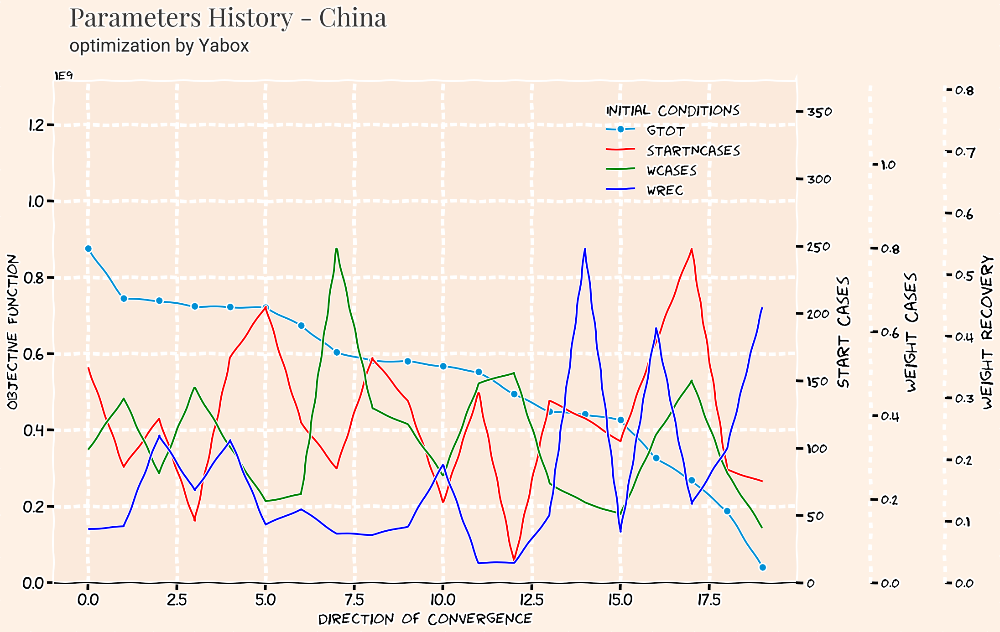

# Results for Italy

,gtot,startdate,startNcases,s0,i0,d0,r0,wcases,wrec,wdth
68,6.313449e+08,2020-02-28,3,43486447,106,64,164,0.4547,0.089,0.4563


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,r0,wcases,wrec,wdth
68,6.313449e+08,2020-02-28,3,43486447,106,64,164,0.4547,0.0890,0.4563
105,8.875736e+08,2020-02-29,136,41128240,178,54,240,0.3082,0.5977,0.0941
48,1.761702e+09,2020-02-29,138,7862860,219,93,70,0.6090,0.1805,0.2105
44,1.909822e+09,2020-02-27,124,57228009,16,108,63,0.2428,0.0690,0.6882
10,2.097863e+09,2020-02-29,147,53408347,87,159,142,0.2635,0.0996,0.6368


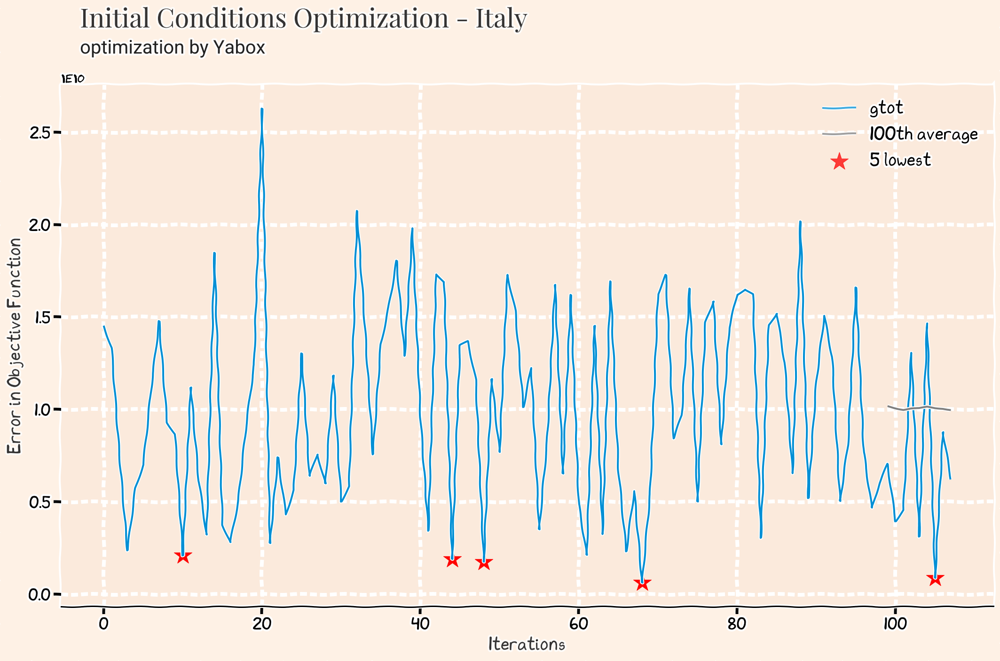

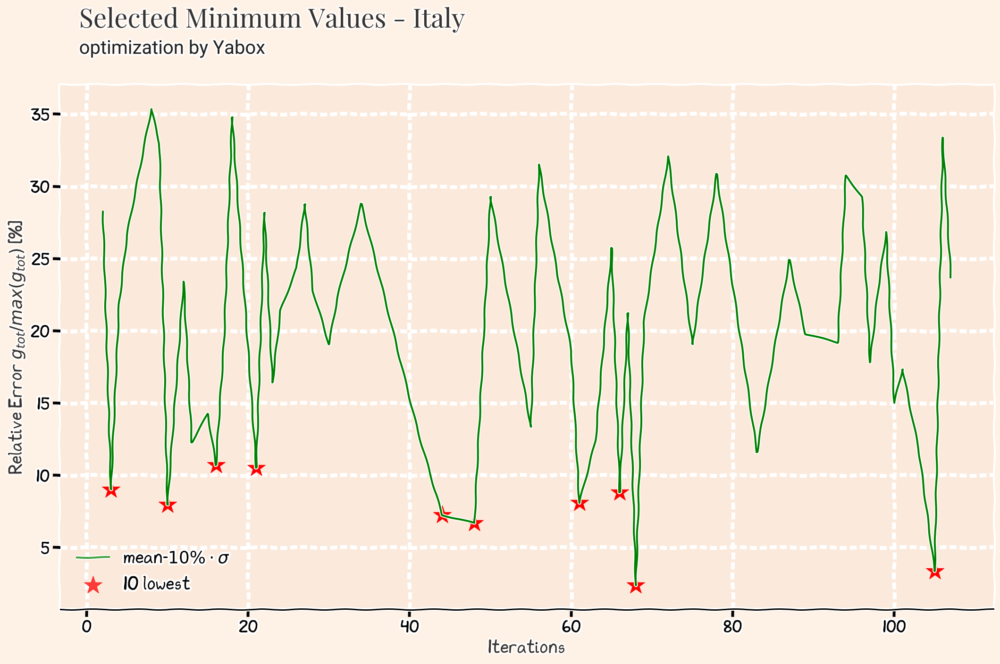

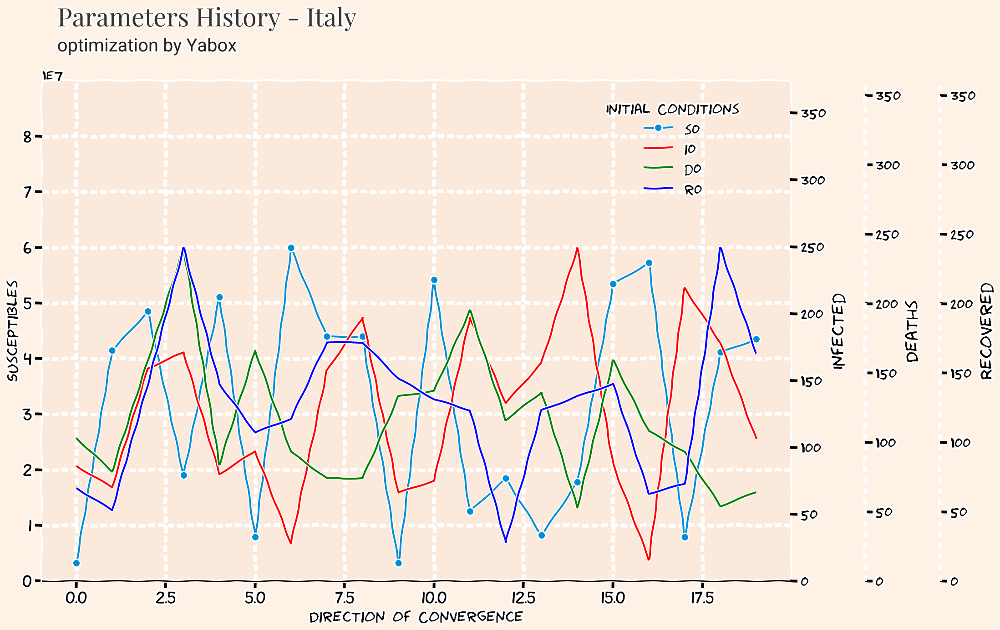

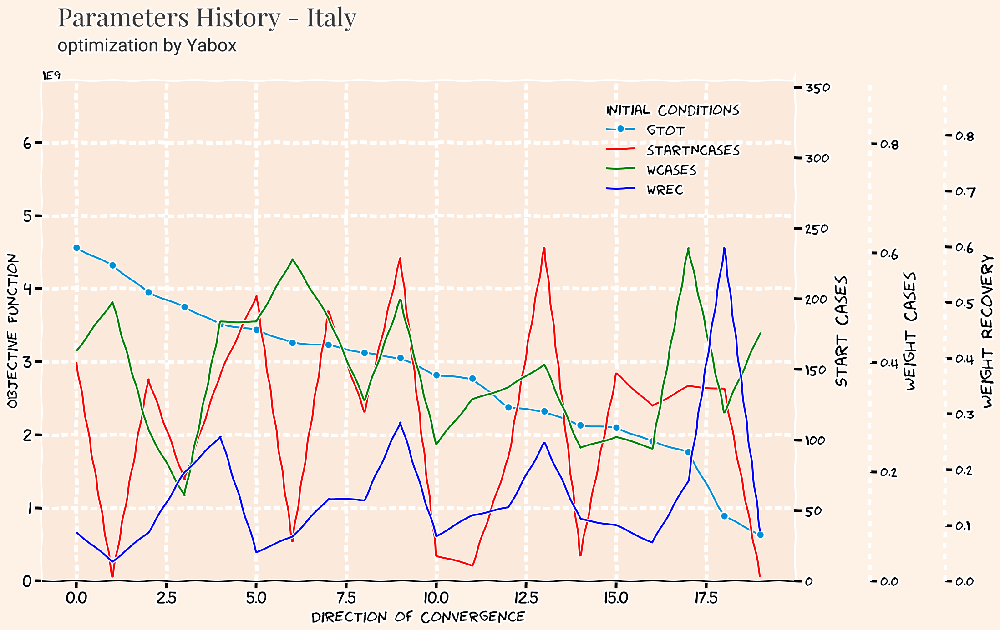

# Results for US

,gtot,startdate,startNcases,s0,i0,d0,r0,wcases,wrec,wdth
23,6.524530e+11,2020-02-18,114,89254715,248,221,149,0.1378,0.6364,0.2258


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,r0,wcases,wrec,wdth
23,6.524530e+11,2020-02-18,114,89254715,248,221,149,0.1378,0.6364,0.2258
69,7.815958e+11,2020-02-21,44,16404169,44,191,163,0.1117,0.3670,0.5213
64,8.946459e+11,2020-02-19,111,44834322,20,105,112,0.2540,0.5480,0.1980
19,1.107525e+12,2020-02-19,238,44834322,16,102,236,0.1195,0.5504,0.3301
82,1.200208e+12,2020-02-19,97,58647043,109,148,8,0.5039,0.3370,0.1591


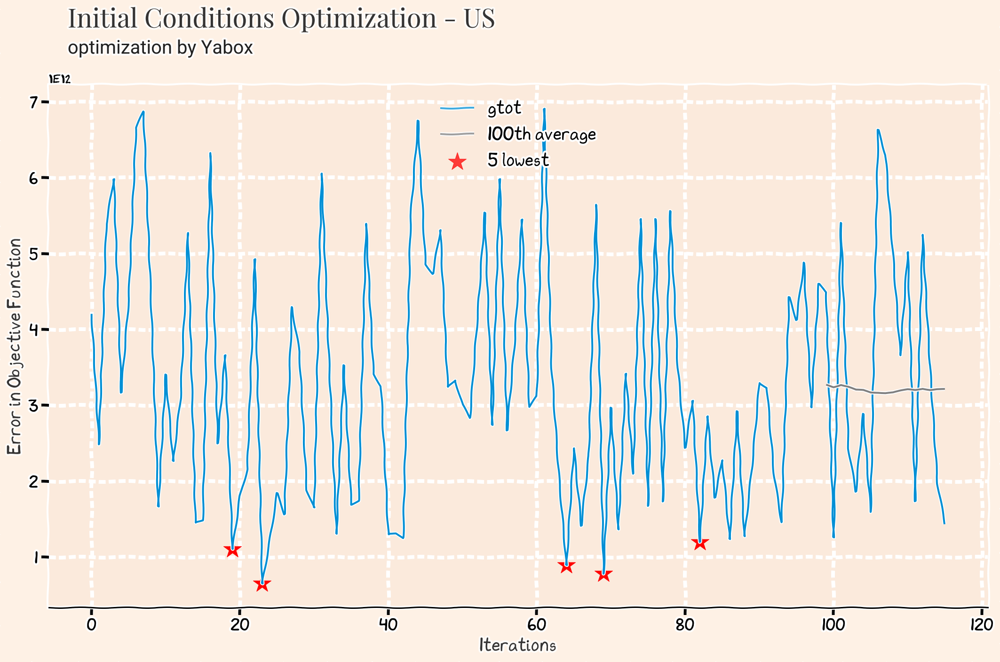

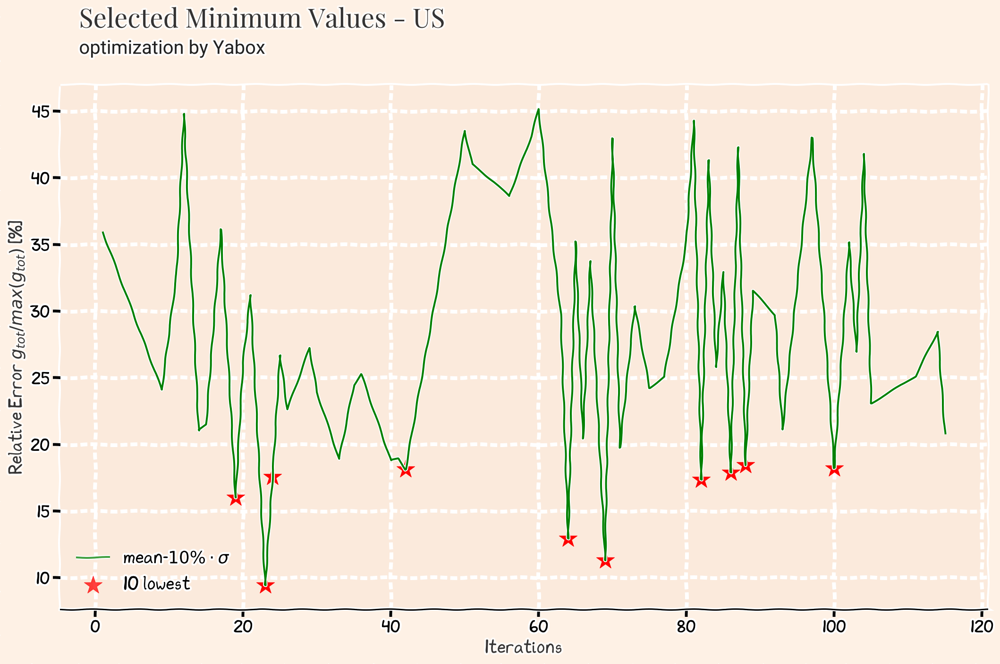

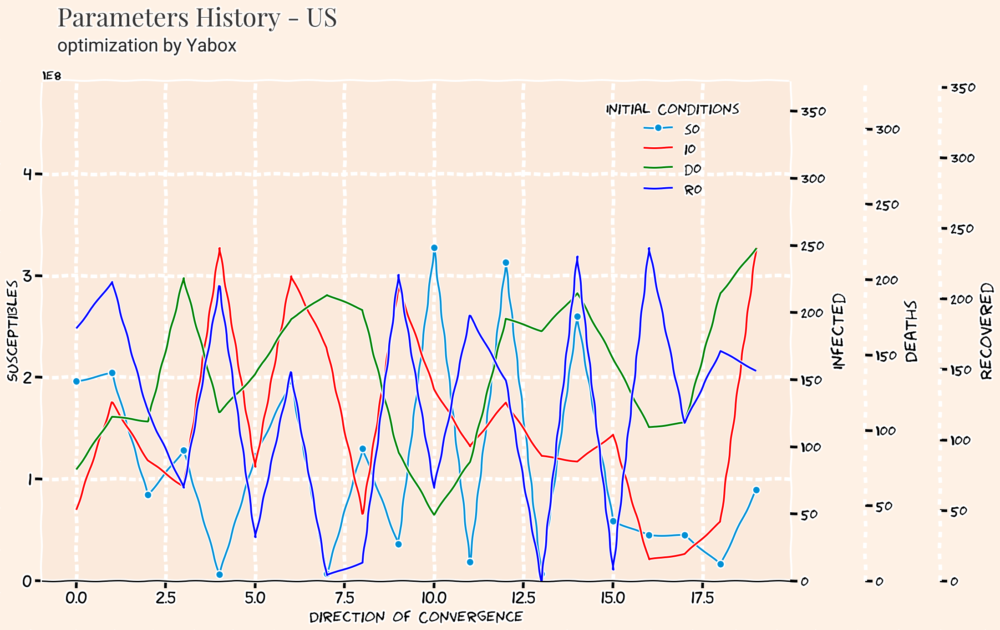

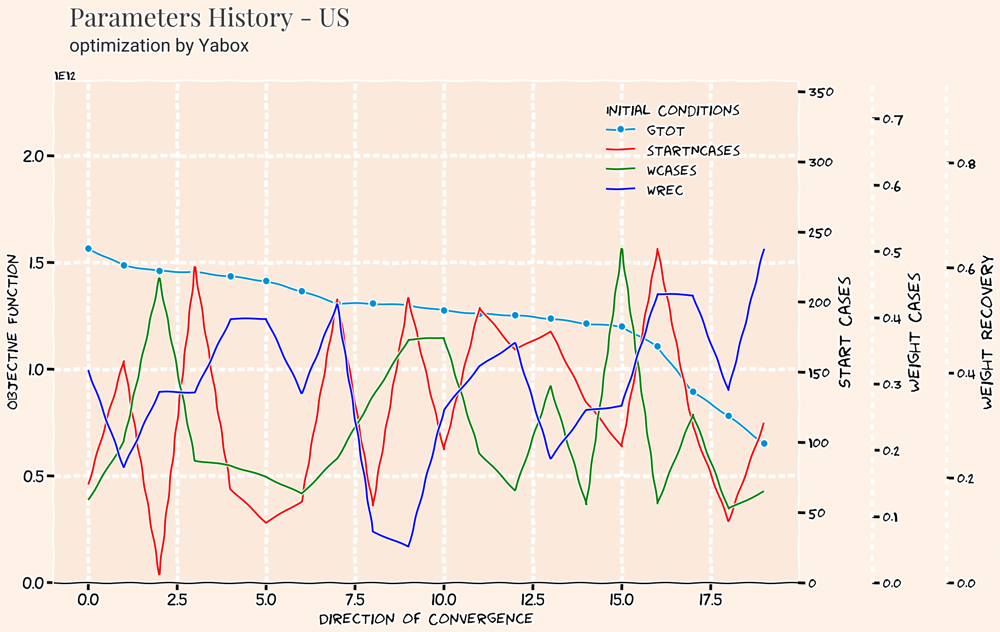

# Results for India

,gtot,startdate,startNcases,s0,i0,d0,r0,wcases,wrec,wdth
24,4.402757e+10,2020-03-10,228,42221513,84,156,142,0.1477,0.2614,0.5909


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,r0,wcases,wrec,wdth
24,4.402757e+10,2020-03-10,228,42221513,84,156,142,0.1477,0.2614,0.5909
0,1.108602e+11,2020-03-08,64,47231862,72,82,124,0.1886,0.3541,0.4573
69,1.110730e+11,2020-03-09,197,42221513,157,100,192,0.0972,0.5519,0.3509
44,1.966244e+11,2020-03-10,35,25552441,178,39,91,0.5309,0.3291,0.1400
75,2.024229e+11,2020-03-08,85,120199452,225,121,224,0.1672,0.2430,0.5898


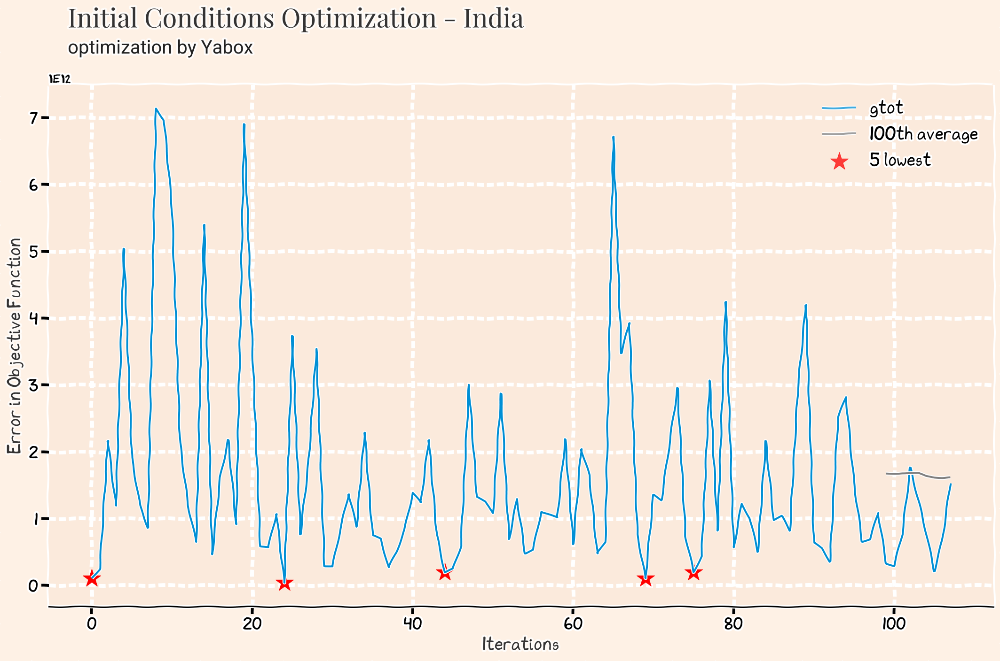

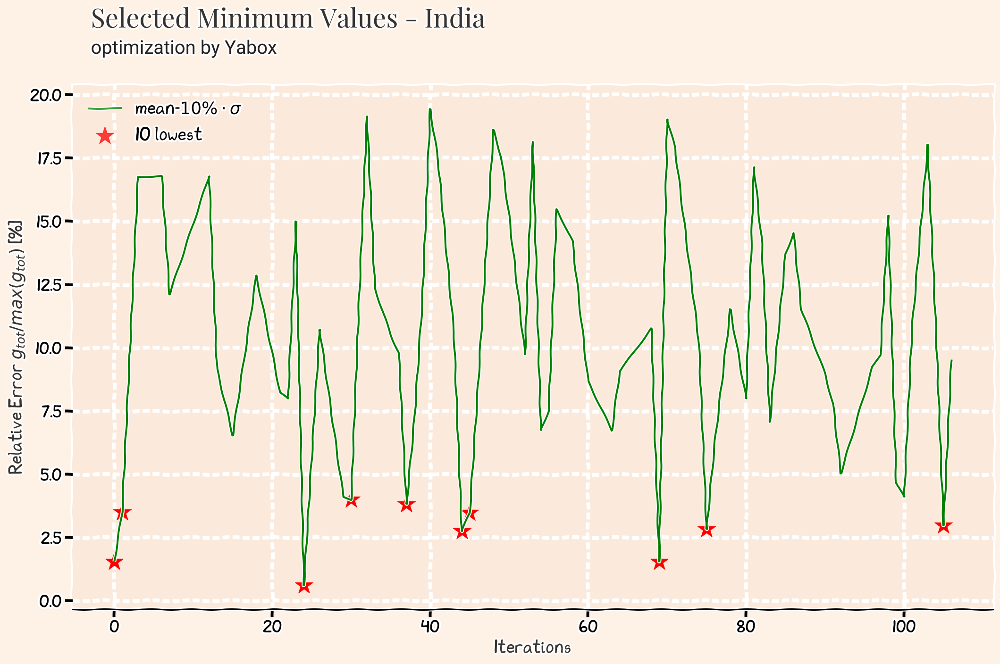

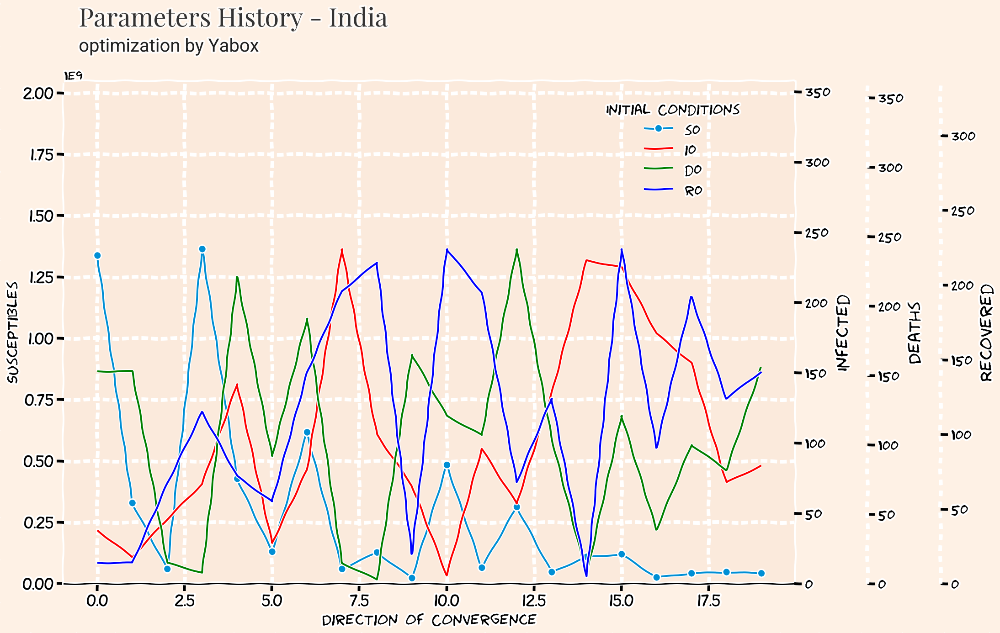

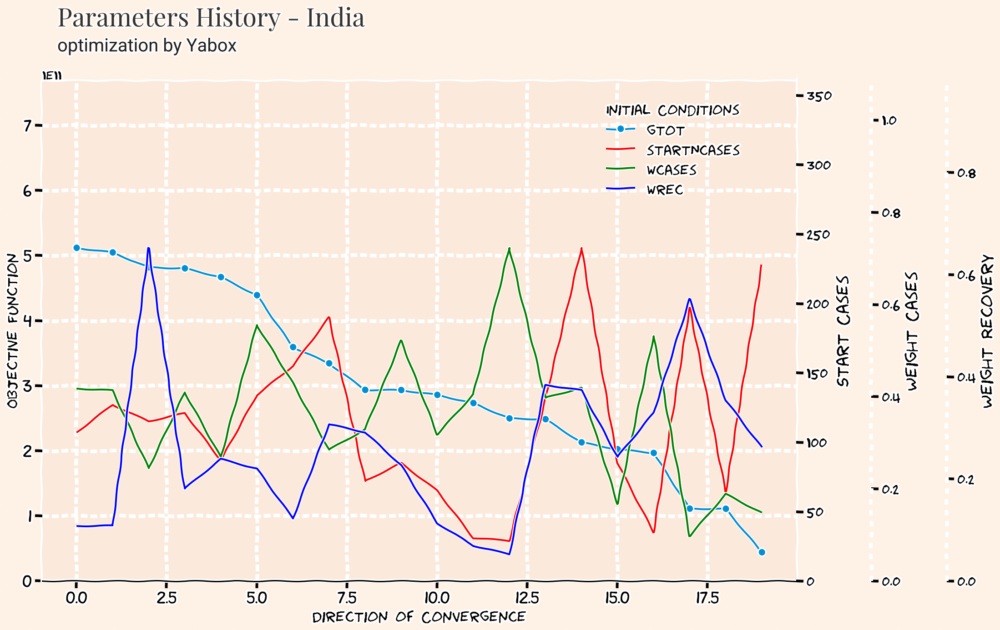

In [11]:
ggtot=[]
for country in countries:
    versionStr=version
    dateparse = lambda x: datetime.strptime(x, ' %m/%d/%y')
    histOptAll= pd.read_table('./results/history_'+country+versionStr+'.csv', sep=",", \
                                index_col=0, header=None, parse_dates=[3], date_parser=dateparse,
        names = ["country","gtot",\
            "s0","startdate","i0","d0","r0","startNcases","wcases","wrec","wdth"])
    histOptAll = histOptAll[['gtot', 'startdate','startNcases','s0',"i0","d0","r0","wcases","wrec","wdth"]]
        
    #clean data
    histOptAll=histOptAll.dropna(how='all')
    histOptAll.gtot=pd.to_numeric(histOptAll.gtot, errors='coerce')
    histOptAll = histOptAll.reset_index(drop=True)
    histOptAll = histOptAll[histOptAll.loc[:,"gtot"]<0.5e14]
    
    #format integers and decimal places
    histOptAll['d0'] = histOptAll['d0'].apply(lambda x: int(x+0.5))
    histOptAll['startNcases'] = histOptAll['startNcases'].apply(lambda x: int(x+0.5))
    histOptAll['s0'] = histOptAll['s0'].apply(lambda x: int(x+0.5))
    histOptAll['i0'] = histOptAll['i0'].apply(lambda x: int(x+0.5))
    histOptAll['r0'] = histOptAll['r0'].apply(lambda x: int(x+0.5))
    histOptAll['wcases'] = histOptAll['wcases'].apply(lambda x: round(x,4))
    histOptAll['wrec'] = histOptAll['wrec'].apply(lambda x: round(x,4))
    histOptAll['wdth'] = histOptAll['wdth'].apply(lambda x: round(x,4))
    
    #print optimum parameters
    histOpt=histOptAll[histOptAll.gtot==min(histOptAll.gtot)]
    histOpt=histOpt.head(1)
    histOpt.to_csv("data/vars_optimized_"+country+model+"HistMin.csv", sep=","
                   , index=False)
        
    #current parameters
    query = dfparam.query('country == "{}"'.format(country)).reset_index()
    parameters = np.array(query.iloc[:, 2:])[0]
    date,predict_range,s0,e0,a0,i0,r0,d0,startNCases,wcases,wrec,wdth = parameters
    
    #query parameters
    j = query['index'].values[0]
    
    #define s0, i0 and d0
    dfparam.at[j, "s0"] = histOpt.s0
    dfparam.at[j, "i0"] = histOpt.i0
    dfparam.at[j, "d0"] = histOpt.d0
    dfparam.at[j, "r0"] = histOpt.r0
    dfparam.at[j, "START"] = histOpt.startNcases

    dfparam['s0'] = dfparam['s0'].astype(int)
    dfparam['a0'] = dfparam['a0'].astype(int)
    dfparam['e0'] = dfparam['e0'].astype(int)
    #define Start N Cases
    dfparam['START'] = dfparam['START'].astype(int)
    #define date, wcases, wrec
    dfparam.at[j, "start-date"] = histOpt.startdate.dt.strftime('%m/%d/%y').values[0]
    dfparam.at[j, "WCASES"] = histOpt.wcases
    dfparam.at[j, "WREC"] = histOpt.wrec
    dfparam.at[j, 'WDTH'] = histOpt.wdth
    
    #save new parameters
    dfparam.to_csv("data/param_optimized_"+model+"_HistMin.csv", sep=",", index=False)    
    
    display(Markdown("# Results for "+country))
    histOpt=calculateWeights(histOpt)    
    display(histOpt.iloc[:,0:10])

    histOptAll=calculateWeights(histOptAll)
    
    #ploty History and get histMin
    histMin=plotHistory(country,model,histOptAll,versionStr)
    
    #initiate ggtot with values
    ggtot.append(histOpt.gtot.values[0])
    
#     #plot params evolution - first set
    plotParams(country,model,histMin,['s0','i0','d0','r0'],['Susceptibles',
                                                'Infected','Deaths','Recovered'],1)
#     #define start date in term of delta days from reference
#     date_str3 = date
#     date_dt3 = datetime.strptime(date_str3,'%m/%d/%y')-timedelta(days = 10)
#     for i in range(0,len(histMin)):
#         histMin.iloc[i,1]=(histMin.iloc[i,1]-date_dt3)/ np.timedelta64(1, 'D')

    #plot params evolution - second set
    plotParams(country,model,histMin,['gtot','startNcases','wcases','wrec'],
               ['Objective Function','Start Cases','Weight Cases','Weight Recovery'],2)

In [12]:
display(Markdown("# Final Results for Initial Conditions"))
display(Markdown("## "+model+" optimization model"))

from IPython.display import HTML

dfparam.columns = map(str.lower, dfparam.columns)

display(Markdown("### Original Weight"))

display(dfparam)

dfparam=calculateWeights(dfparam)
dfparam['gtot_1M'] = pd.Series(ggtot)/1e6
dfparam['gtot_1M'] = dfparam['gtot_1M'].astype(int)

display(Markdown("### Real Weight"))

dfparam['wcases']=dfparam['wcases'].map(lambda n: '{:,.4f}'.format(n))
dfparam['wrec']=dfparam['wrec'].map(lambda n: '{:,.4f}'.format(n))
dfparam['wdth']=dfparam['wdth'].map(lambda n: '{:,.4f}'.format(n))

s = dfparam.style.background_gradient(cmap='RdYlGn_r',
            axis=0,subset=['s0','i0','r0','d0','gtot_1M'])
display(s)
del dfparam['gtot_1M']




# Final Results for Initial Conditions

## Yabox optimization model

### Original Weight

,country,start-date,prediction-range,s0,e0,a0,i0,r0,d0,start,wcases,wrec,wdth
0,Brazil,03/01/20,200,5351475,0,0,94,232,195,246,0.2626,0.5071,0.5957
1,China,01/27/20,200,327516,0,0,200,100,50,50,0.1903,0.6452,0.6084
2,Italy,02/28/20,200,43486447,0,0,106,164,64,3,0.3301,0.0646,0.3313
3,US,02/18/20,200,89254715,0,0,248,149,221,114,0.1641,0.7578,0.2689
4,India,03/10/20,200,42221513,0,0,84,142,156,228,0.1575,0.2788,0.6303


### Real Weight

,country,start-date,prediction-range,s0,e0,a0,i0,r0,d0,start,wcases,wrec,wdth,gtot_1M
0,Brazil,03/01/20,200,5351475,0,0,94,232,195,246,0.1923,0.3714,0.4363,42949
1,China,01/27/20,200,327516,0,0,200,100,50,50,0.1318,0.4468,0.4214,40
2,Italy,02/28/20,200,43486447,0,0,106,164,64,3,0.4547,0.0890,0.4563,631
3,US,02/18/20,200,89254715,0,0,248,149,221,114,0.1378,0.6364,0.2258,652453
4,India,03/10/20,200,42221513,0,0,84,142,156,228,0.1477,0.2614,0.5909,44027
